### Stats Concepts Understanding

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [2]:
## With weight and height, we are going to find whether that person is male/female
df=pd.read_csv('weight-height.csv')
df.head()

,Gender,Height,Weight
0,Male,73.847017,241.893563
1,Male,68.781904,162.310473
2,Male,74.110105,212.740856
3,Male,71.730978,220.042470
4,Male,69.881796,206.349801


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Gender  10000 non-null  object 
 1   Height  10000 non-null  float64
 2   Weight  10000 non-null  float64
dtypes: float64(2), object(1)
memory usage: 234.5+ KB


In [4]:
# Gender is of object type since Gender contains string values

In [5]:
df['Gender'].unique()

array(['Male', 'Female'], dtype=object)

In [6]:
df[df["Gender"]=="Male"]   ## slicing out the male people

,Gender,Height,Weight
0,Male,73.847017,241.893563
1,Male,68.781904,162.310473
2,Male,74.110105,212.740856
3,Male,71.730978,220.042470
4,Male,69.881796,206.349801
...,...,...,...
4995,Male,68.860062,177.131052
4996,Male,68.973423,159.285228
4997,Male,67.013795,199.195400
4998,Male,71.557718,185.905910


In [7]:
data_male   = df[df["Gender"]=="Male"]     ## all the male data
data_female = df[df["Gender"]=="Female"]   ## all the female data

## Univariate, Bivariate and Multi-variate Analysis

## Univariate

In [8]:
## based on the number of zeros in the row under data_male['Height']
np.zeros_like(data_male["Height"])   

array([0., 0., 0., ..., 0., 0., 0.])

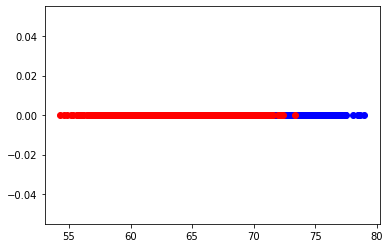

In [9]:
## In Uni-variate there is NO y-axis. Only one dimension, So only we are making Y-axis as 0

plt.plot(data_male["Height"],np.zeros_like(data_male["Height"]),'bo')   ## male --> blue color
plt.plot(data_female["Height"],np.zeros_like(data_female["Height"]),'ro')  ## female --> red color
plt.show()

<AxesSubplot:xlabel='Height'>

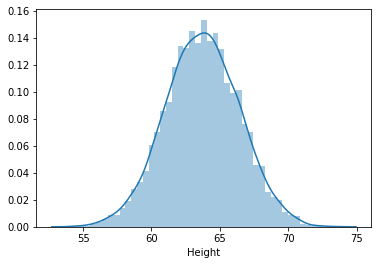

In [10]:
## Female heights
## From the above graph, it is observed that female height ranges from 55 to nearly 74
sns.distplot(data_female['Height'])   ## with pdf curve and histogram

<AxesSubplot:xlabel='Height'>

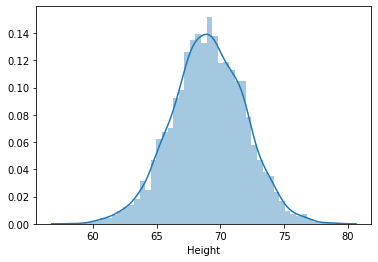

In [11]:
## Male heights
## From the above graph, it is observed that male height ranges from 55 to nearly 80
sns.distplot(data_male['Height'])   ## with pdf curve and histogram

In [12]:
## Smoothen version of histogram --> pdf

C:\Users\Prashanth\anaconda3\lib\site-packages\seaborn\axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


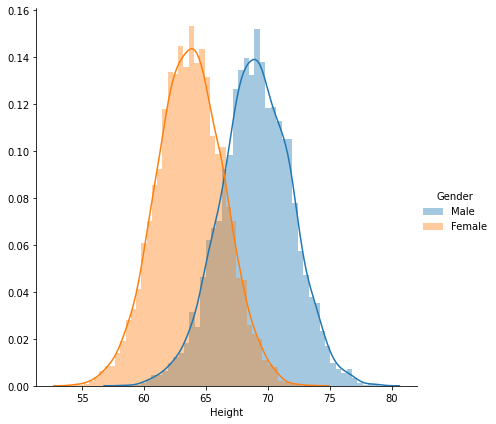

In [13]:
sns.FacetGrid(df,hue="Gender",size=6).map(sns.distplot,"Height").add_legend()
plt.show()

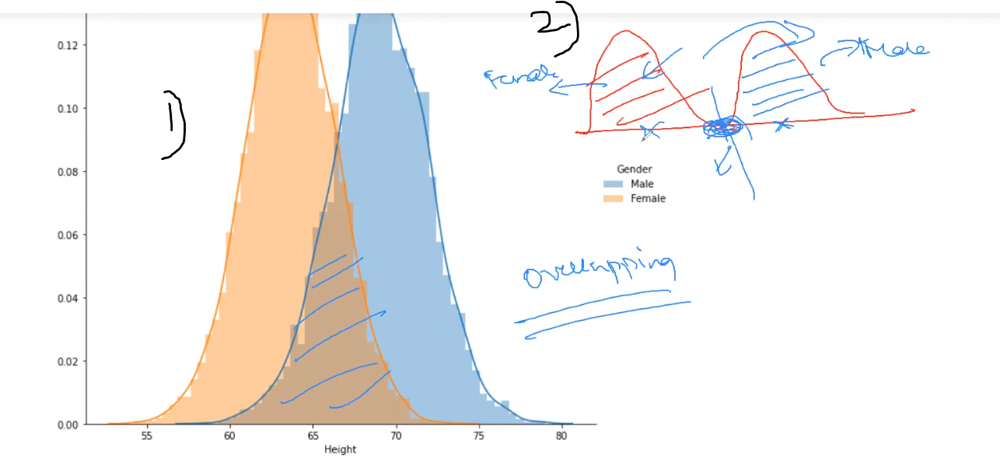

In [14]:
## In 1st diagram there are lots of overlapping. In 2nd diagram there no overlapping. 
## So tomorrow if a new data comes also with 2nd diagram we could clearly say this height
## person belongs to male/female

C:\Users\Prashanth\anaconda3\lib\site-packages\seaborn\axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


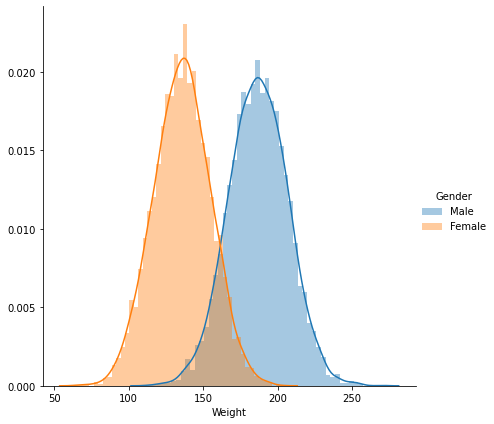

In [15]:
sns.FacetGrid(df,hue="Gender",size=6).map(sns.distplot,"Weight").add_legend()
plt.show()

In [16]:
## maximum height --> male (above 200 more probability)
## minimum height --> female (below 100 more probability)

<AxesSubplot:xlabel='Weight'>

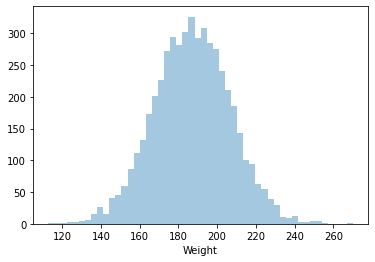

In [17]:
sns.distplot(data_male['Weight'],kde=False)  ## without pdf curve, only histogram

## Percentile

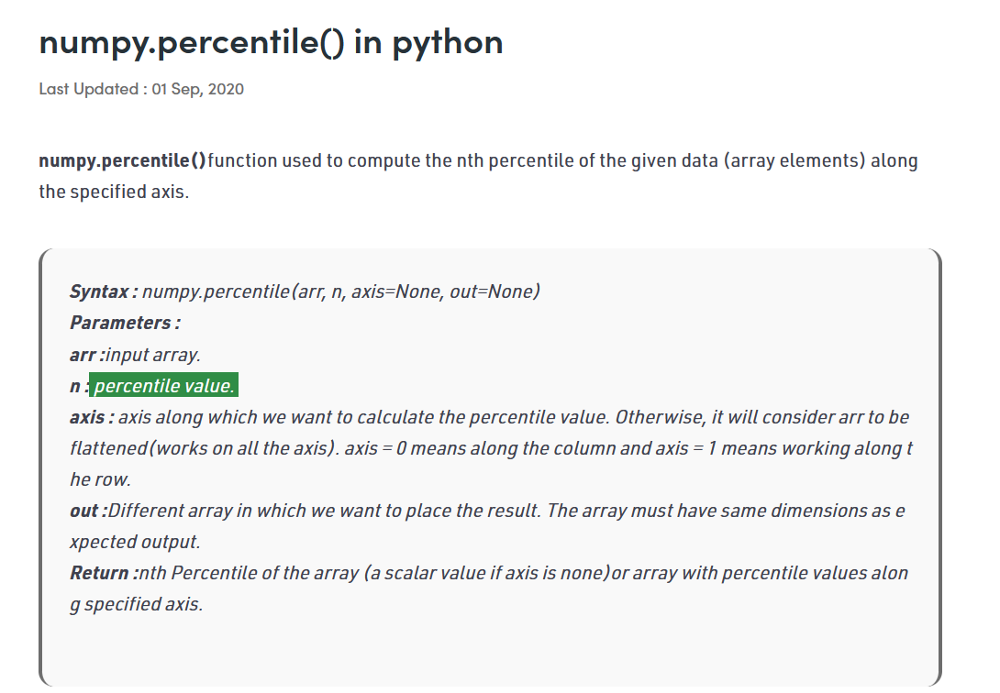

list1 = [10,20,30,40,50,60,70,80,90,100]   ## marks scored of entire population

10 --> 0 percentile 

20 --> 10 percentile  (10% of entire population will be less than 20 )

30 --> 20 percentile  (20% of entire population will be less than 30 )

In [49]:
print(np.percentile([10,20,30,40,50,60,70,80,90,100],0))   
# 0 percentile 10 is the minimum mark (below 10 there are no students)

print(np.percentile([10,20,30,40,50,60,70,80,90,100],10))  
# 10 percentile (19% of population will be less than 10)

print(np.percentile([10,20,30,40,50,60,70,80,90,100],20))  
# 28 percentile (28% of population will be less than 20)

10.0
19.0
28.0


In [53]:
arr = [20, 2, 7, 1, 34]
arr.sort()

In [54]:
print("arr : ", arr)
print("50th percentile of arr : ",
       np.percentile(arr, 50))
print("25th percentile of arr : ",
       np.percentile(arr, 25))
print("75th percentile of arr : ",
       np.percentile(arr, 75))

arr :  [1, 2, 7, 20, 34]
50th percentile of arr :  7.0
25th percentile of arr :  2.0
75th percentile of arr :  20.0


In [48]:
## Percentiles
print("25 percentile value is ",np.percentile(data_male['Weight'],25))
print("55 percentile value is ",np.percentile(data_male['Weight'],55))
print("75 percentile value is ",np.percentile(data_male['Weight'],75))
print("90 percentile value is ",np.percentile(data_male['Weight'],90))

25 percentile value is  173.887767325
55 percentile value is  189.44214385
75 percentile value is  200.35780177499998
90 percentile value is  211.76868491000002


In [20]:
## 90% of entire weight is less than 211

### Cumulative Density Function

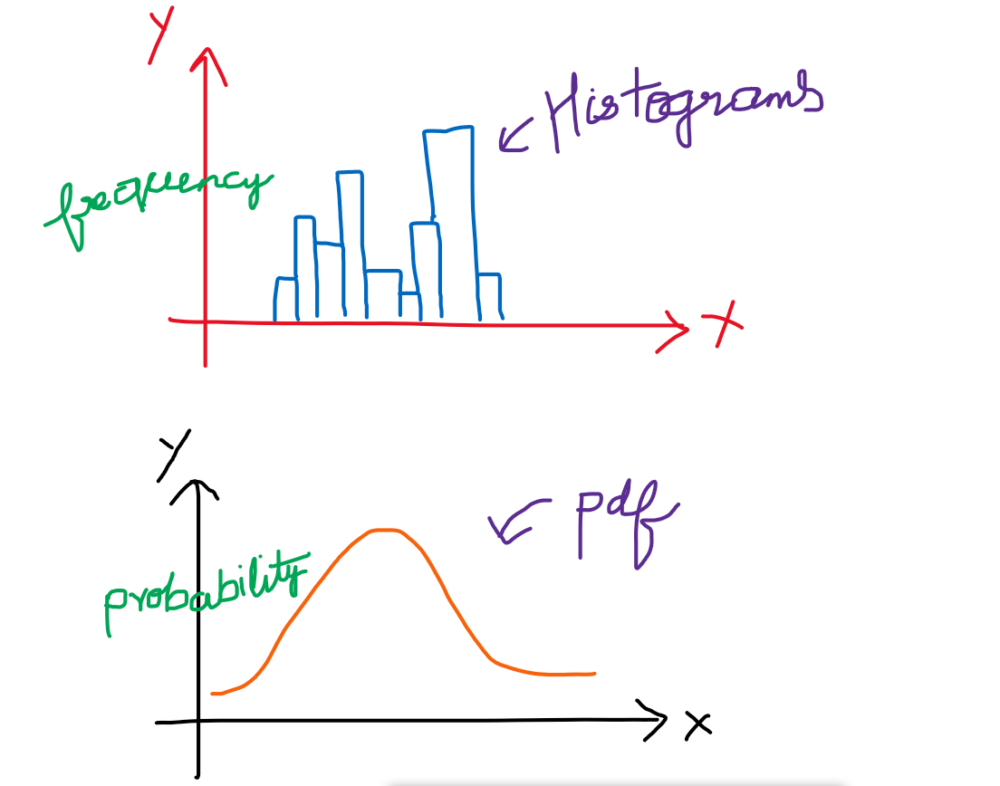

## Plot of height

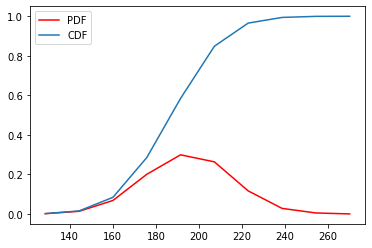

In [27]:
# getting data of the histogram 
count, bins_count = np.histogram(data_male['Weight'], bins=10) 
  
# finding the PDF of the histogram using count values 
pdf = count / sum(count) 
  
# using numpy np.cumsum to calculate the CDF 
# We can also find using the PDF values by looping and adding 
cdf = np.cumsum(pdf) 
  
# plotting PDF and CDF 
plt.plot(bins_count[1:], pdf, color="red", label="PDF") 
plt.plot(bins_count[1:], cdf, label="CDF") 
plt.legend() 
plt.show()

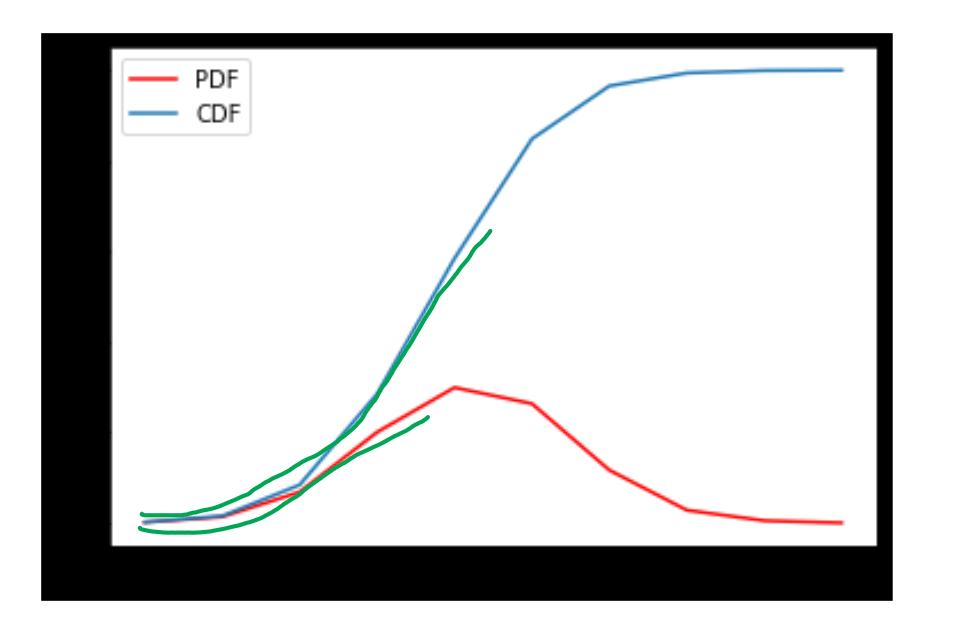

Initially pdf increases to the cdf also increases

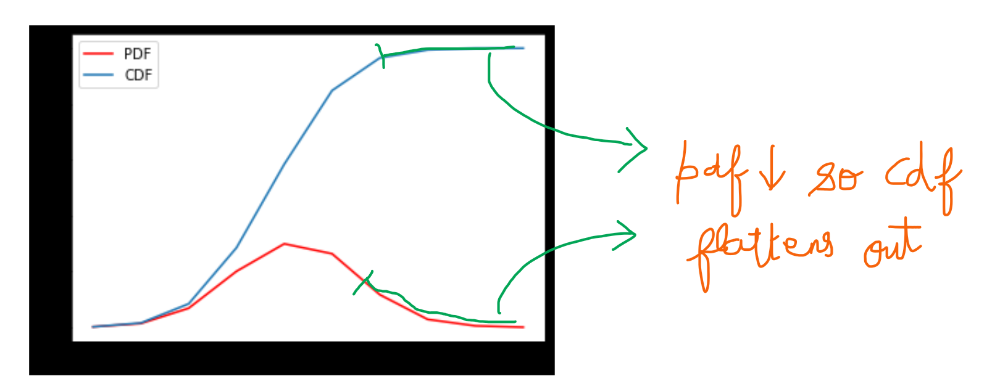

In [28]:
## Now the Y-axis will tell the entire probability of the entire data.

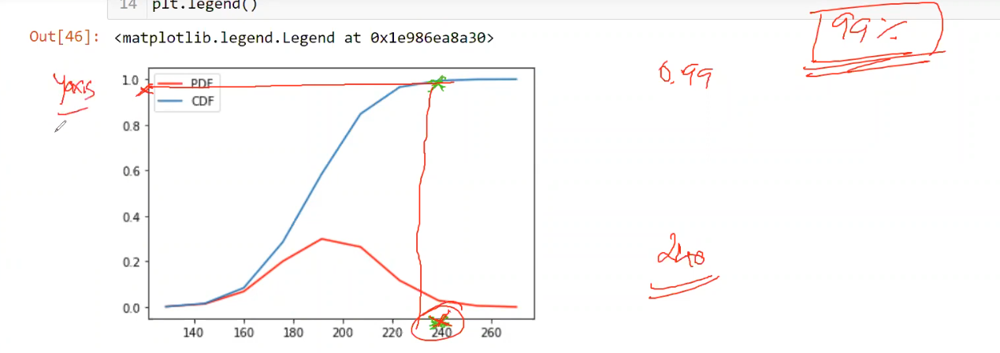

In [29]:
## What is the percentile of 240????
## probability --> 0.99, this means that 99 percentile
## 99 percentage of total population inside the data-set is less than 240
## Maximum value in the Y-axis=1

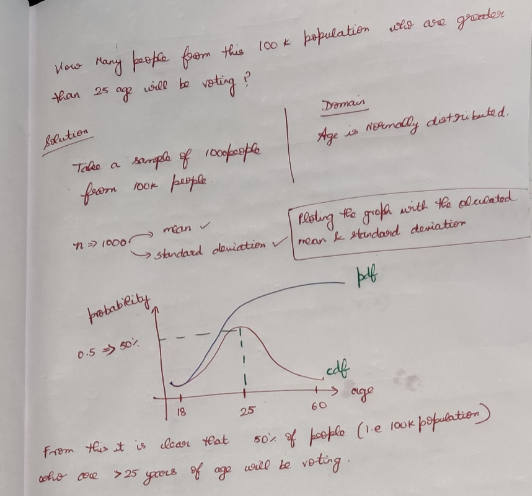

## Plot of height

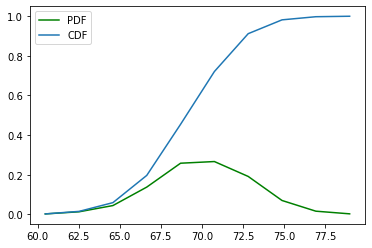

In [31]:
# getting data of the histogram 
count, bins_count = np.histogram(data_male['Height'], bins=10) 
  
# finding the PDF of the histogram using count values 
pdf = count / sum(count) 
  
# using numpy np.cumsum to calculate the CDF 
# We can also find using the PDF values by looping and adding 
cdf = np.cumsum(pdf) 
  
# plotting PDF and CDF 
plt.plot(bins_count[1:], pdf, color="green", label="PDF") 
plt.plot(bins_count[1:], cdf, label="CDF") 
plt.legend() 
plt.show()

### Bivariate Analysis

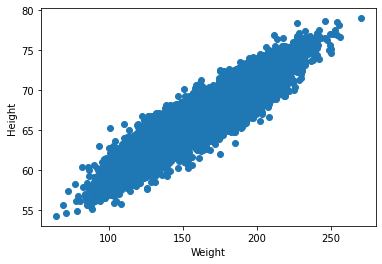

In [33]:
plt.scatter(df['Weight'],df['Height'])
plt.xlabel("Weight")
plt.ylabel("Height")
plt.show()

In [36]:
## Bivariate analysis --> With two variables (height and weight), we can able 
## to know that when weight increases height also increases

## Multi-variate analysis

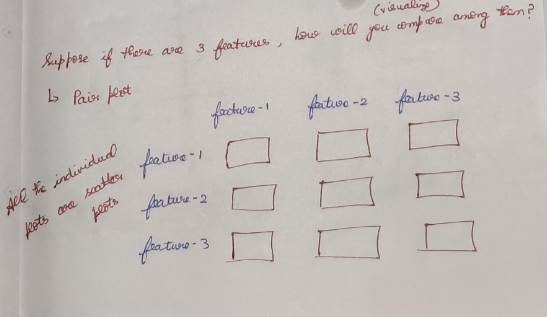

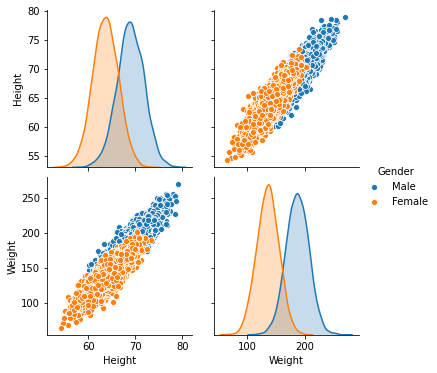

In [37]:
sns.pairplot(df,hue="Gender")
plt.show()

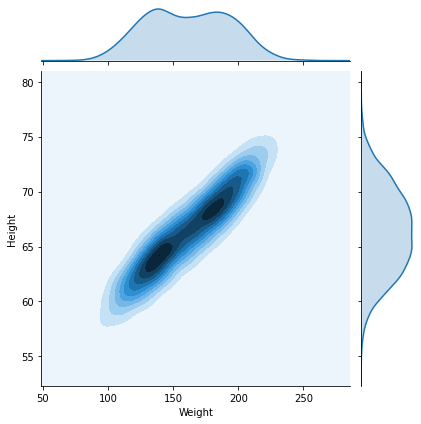

In [38]:
sns.jointplot(x="Weight",y="Height",data=df,kind="kde")
plt.show()

### Covariance, Pearson Correlation, Spearman Rank Correlation Coefficient

In [62]:
print("Pearson : ") # by-default pearson nethod
df.corr()

Pearson : 


,Height,Weight
Height,1.000000,0.924756
Weight,0.924756,1.000000


In [63]:
print("Speaman : ")
df.corr(method='spearman')

Speaman : 


,Height,Weight
Height,1.000000,0.925708
Weight,0.925708,1.000000


In [64]:
## Spearman is more accurate

In [65]:
df = sns.load_dataset('iris')
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


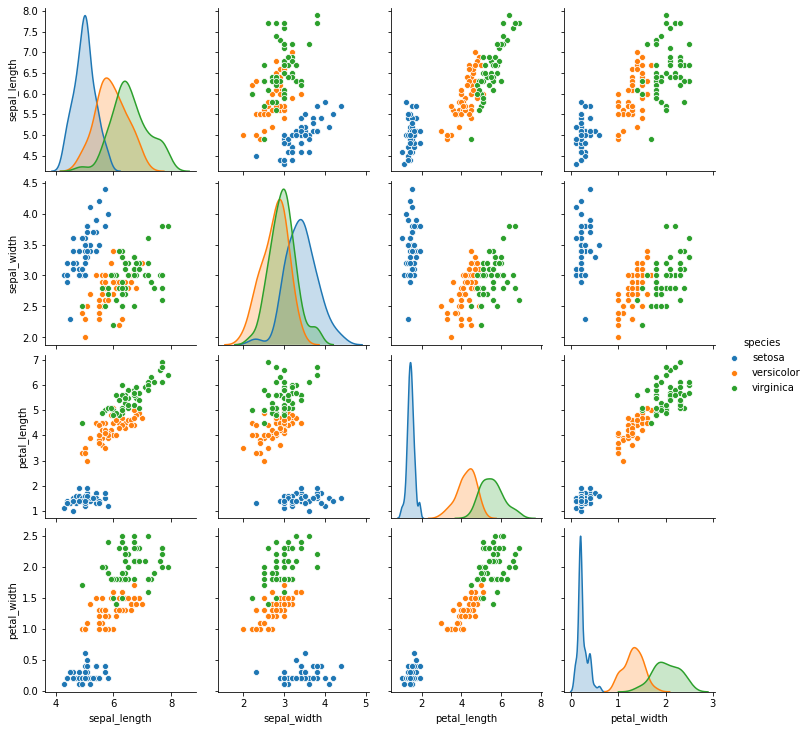

In [67]:
sns.pairplot(df,hue='species')
plt.show()

In [69]:
df.corr(method='spearman')

,sepal_length,sepal_width,petal_length,petal_width
sepal_length,1.000000,-0.166778,0.881898,0.834289
sepal_width,-0.166778,1.000000,-0.309635,-0.289032
petal_length,0.881898,-0.309635,1.000000,0.937667
petal_width,0.834289,-0.289032,0.937667,1.000000


In [70]:
## sepal-length and sepal-width are -ve ly correlated
## sepal length and petal_length are +ve ly correlated
## petal width and petal length are highly +ve ly correlated

## Multi-collinearity 

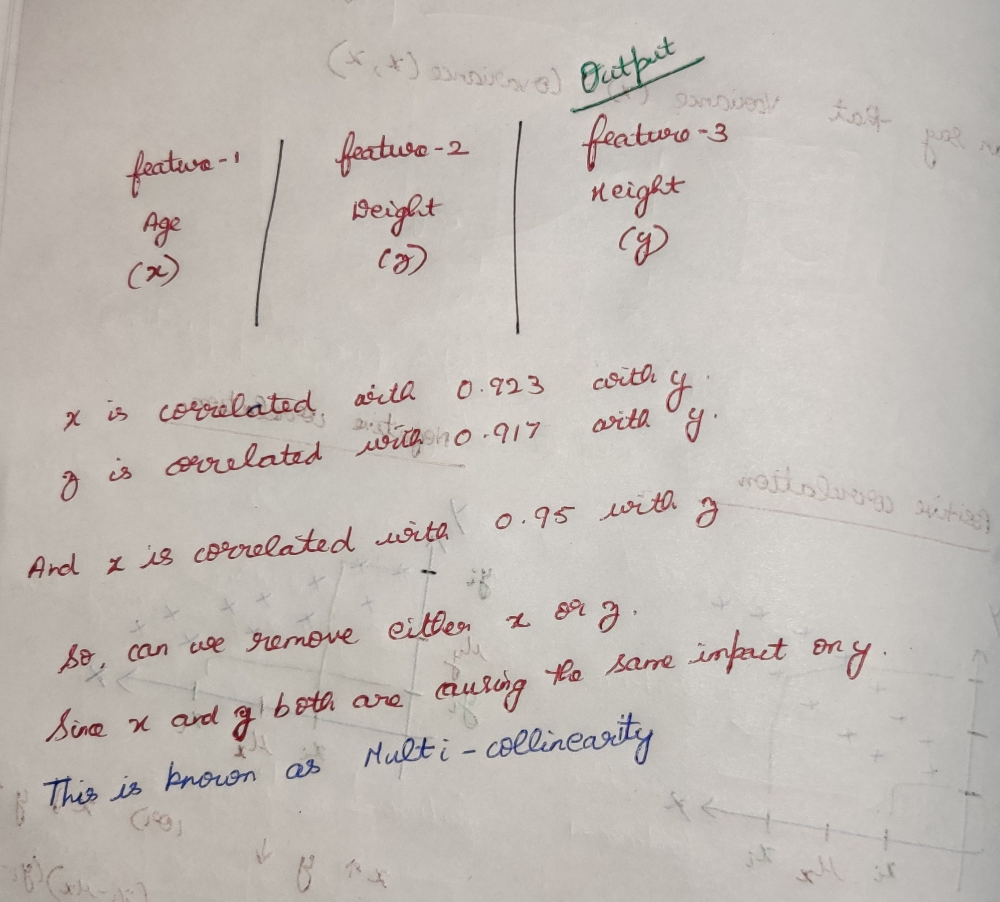

## Question-1

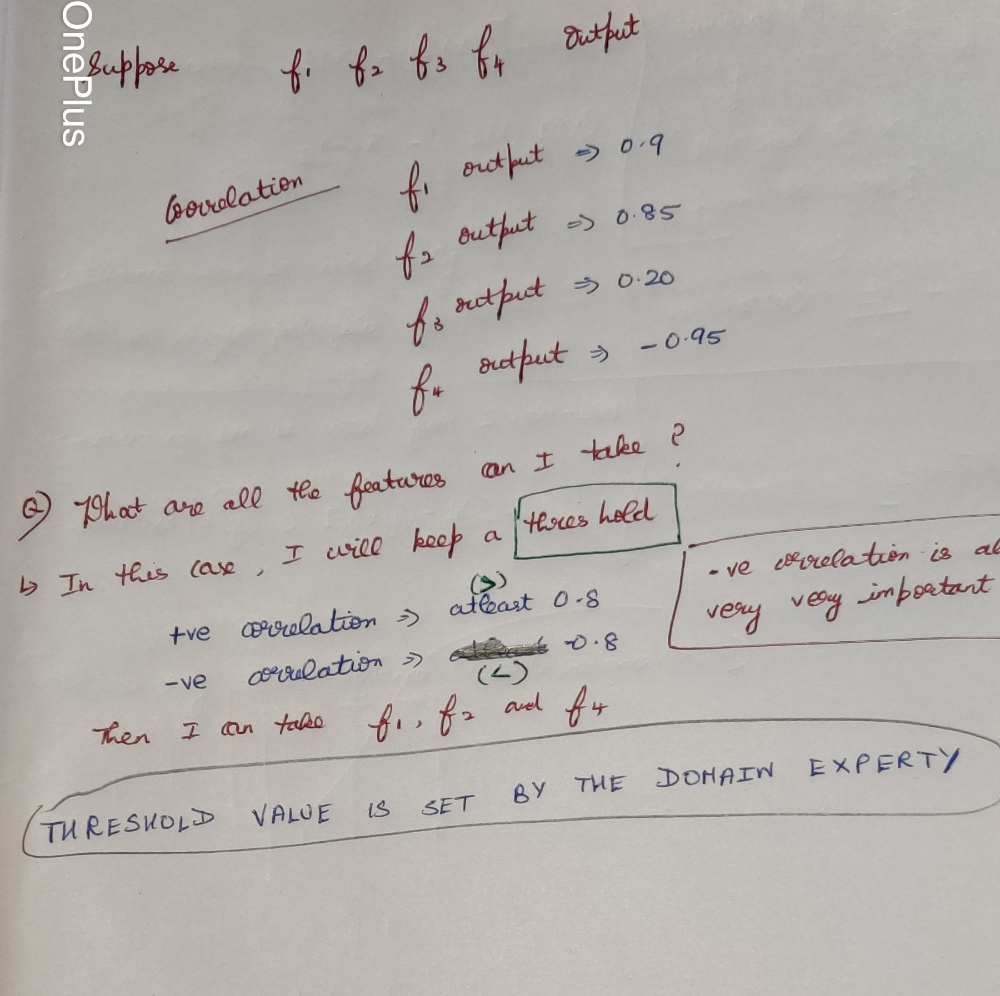

## Question-2

In [71]:
df.corr(method='spearman')

,sepal_length,sepal_width,petal_length,petal_width
sepal_length,1.000000,-0.166778,0.881898,0.834289
sepal_width,-0.166778,1.000000,-0.309635,-0.289032
petal_length,0.881898,-0.309635,1.000000,0.937667
petal_width,0.834289,-0.289032,0.937667,1.000000


Here petal-length and petal-width are highly correlated, so can remove any one